In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import sklearn

In [2]:
df=pd.read_csv("Customer Data.csv")

In [3]:
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [4]:
df.max()

CUST_ID                                  C19190
BALANCE                             19043.13856
BALANCE_FREQUENCY                           1.0
PURCHASES                              49039.57
ONEOFF_PURCHASES                       40761.25
INSTALLMENTS_PURCHASES                  22500.0
CASH_ADVANCE                        47137.21176
PURCHASES_FREQUENCY                         1.0
ONEOFF_PURCHASES_FREQUENCY                  1.0
PURCHASES_INSTALLMENTS_FREQUENCY            1.0
CASH_ADVANCE_FREQUENCY                      1.5
CASH_ADVANCE_TRX                            123
PURCHASES_TRX                               358
CREDIT_LIMIT                            30000.0
PAYMENTS                            50721.48336
MINIMUM_PAYMENTS                    76406.20752
PRC_FULL_PAYMENT                            1.0
TENURE                                       12
dtype: object

In [5]:
df.min()

CUST_ID                               C10001
BALANCE                                  0.0
BALANCE_FREQUENCY                        0.0
PURCHASES                                0.0
ONEOFF_PURCHASES                         0.0
INSTALLMENTS_PURCHASES                   0.0
CASH_ADVANCE                             0.0
PURCHASES_FREQUENCY                      0.0
ONEOFF_PURCHASES_FREQUENCY               0.0
PURCHASES_INSTALLMENTS_FREQUENCY         0.0
CASH_ADVANCE_FREQUENCY                   0.0
CASH_ADVANCE_TRX                           0
PURCHASES_TRX                              0
CREDIT_LIMIT                            50.0
PAYMENTS                                 0.0
MINIMUM_PAYMENTS                    0.019163
PRC_FULL_PAYMENT                         0.0
TENURE                                     6
dtype: object

In [6]:
df.shape

(8950, 18)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [8]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [9]:
df.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [10]:
!pip install feature-engine

In [11]:
from feature_engine.imputation import MeanMedianImputer
impute=MeanMedianImputer()
df=impute.fit_transform(df)

In [12]:
df.isnull().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [13]:
import plotly.express as px
fig=px.histogram(df, x='BALANCE', nbins=50, title='Distribution of Balance')
fig.show()

In [14]:
px.scatter(df, x='BALANCE', y='PURCHASES', color='CREDIT_LIMIT',
                  title='Balance vs Purchases Colored by Credit Limit')

In [15]:
#Correlation Matrix
import plotly.figure_factory as ff

# Filter out non-numeric columns
numeric_df = df.select_dtypes(include=[np.number])

# Calculate the correlation matrix
correlation_matrix = numeric_df.corr()

# Create an annotated heatmap
fig = ff.create_annotated_heatmap(
    z=correlation_matrix.to_numpy(),
    x=list(correlation_matrix.columns),
    y=list(correlation_matrix.index),
    annotation_text=correlation_matrix.round(2).values,
    colorscale='Viridis',
)
fig.update_layout(title='Correlation Matrix')
fig.show()

In [16]:
#pairwise relationships
fig=px.scatter_matrix(df)
fig.update_layout(title='Pairwise Relationships')
fig.show()

In [17]:
#category-based distributions
px.box(df, x='TENURE', y='BALANCE', points="all", title='Boxplot of Balance by Tenure')

In [18]:
fig=px.scatter(df, x='PURCHASES', y='PAYMENTS', color='TENURE', title='Purchases vs Payments Segmentation by Tenure')
fig.show()

In [19]:
#frequency analysis of purchase
fig=px.bar(df, x='PURCHASES_FREQUENCY', y='PURCHASES', title='Purchases Frequency')
fig.show()

In [20]:
#3d scatter plot
fig=px.scatter_3d(df, x='BALANCE', y='PURCHASES', z='PAYMENTS', color='CREDIT_LIMIT')
fig.show()

In [21]:
#Parallel Cordinates Plot
px.parallel_coordinates(df, color='PURCHASES_FREQUENCY')

In [22]:
#Sunburst Chart for Purchase Categories
px.sunburst(df, path=['PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY'],title='Purchase Categories Sunburst Chart')

In [23]:
# Animated Bubble Chart for Cash Advance
px.scatter(df, x='CASH_ADVANCE', y='BALANCE', animation_frame='TENURE', size='CASH_ADVANCE_TRX',
color='PURCHASES_TRX', hover_name='CREDIT_LIMIT', log_x=True, log_y=True,
title='Animate Buubble Chart for Cash Advance')

In [24]:
#preproceesing data:
#scaling
#dimention reduction
#outlier reduction

In [25]:
df=df.drop(['CUST_ID'],axis=1) #dropping cust_id col

In [26]:
df.max()

BALANCE                             19043.13856
BALANCE_FREQUENCY                       1.00000
PURCHASES                           49039.57000
ONEOFF_PURCHASES                    40761.25000
INSTALLMENTS_PURCHASES              22500.00000
CASH_ADVANCE                        47137.21176
PURCHASES_FREQUENCY                     1.00000
ONEOFF_PURCHASES_FREQUENCY              1.00000
PURCHASES_INSTALLMENTS_FREQUENCY        1.00000
CASH_ADVANCE_FREQUENCY                  1.50000
CASH_ADVANCE_TRX                      123.00000
PURCHASES_TRX                         358.00000
CREDIT_LIMIT                        30000.00000
PAYMENTS                            50721.48336
MINIMUM_PAYMENTS                    76406.20752
PRC_FULL_PAYMENT                        1.00000
TENURE                                 12.00000
dtype: float64

In [27]:
#oulier handling
from feature_engine.outliers import Winsorizer
column = ['BALANCE', 'PURCHASES']
out = Winsorizer(capping_method='gaussian', variables=column)
df_out = out.fit_transform(df)

In [28]:
px.box(df_out,x='TENURE',y='BALANCE')
px.box(df_out,x='TENURE',y='PURCHASES')

In [29]:
from sklearn.preprocessing import StandardScaler
Scaler=StandardScaler()
scaled_df=Scaler.fit_transform(df)

In [30]:
scaled_df

array([[-0.73198937, -0.24943448, -0.42489974, ..., -0.3024    ,
        -0.52555097,  0.36067954],
       [ 0.78696085,  0.13432467, -0.46955188, ...,  0.09749953,
         0.2342269 ,  0.36067954],
       [ 0.44713513,  0.51808382, -0.10766823, ..., -0.0932934 ,
        -0.52555097,  0.36067954],
       ...,
       [-0.7403981 , -0.18547673, -0.40196519, ..., -0.32687479,
         0.32919999, -4.12276757],
       [-0.74517423, -0.18547673, -0.46955188, ..., -0.33830497,
         0.32919999, -4.12276757],
       [-0.57257511, -0.88903307,  0.04214581, ..., -0.3243581 ,
        -0.52555097, -4.12276757]])

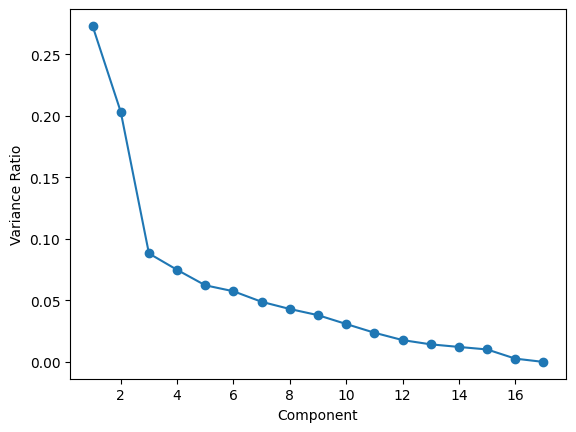

In [31]:
from sklearn.decomposition import PCA
pca=PCA()
pca.fit(scaled_df)
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_, marker='o')
plt.xlabel('Component')
plt.ylabel('Variance Ratio')
plt.show()

In [32]:
from sklearn.decomposition import PCA
pca=PCA(n_components=2)
df_pca=pca.fit_transform(scaled_df)
df_pca=pd.DataFrame(data=df_pca,columns=['PCA1','PCA2']) #convrt to dataframe

In [33]:
df_pca

,PCA1,PCA2
0,-1.683650,-1.072240
1,-1.134085,2.509138
2,0.969392,-0.383563
3,-0.888221,0.004642
4,-1.600022,-0.683790
...,...,...
8945,-0.362572,-2.013429
8946,-0.580811,-1.675657
8947,-0.928986,-1.808041
8948,-2.337844,-0.653608


In [34]:
#elbow method for finding best k value
from sklearn.cluster import KMeans

In [35]:
inertia=[]
for k in range(1,11):
    kmeans=KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_pca)
    inertia.append(kmeans.inertia_)

In [36]:
px.line(x=range(1, 11), y=inertia,labels={'x': 'Clusters', 'y': 'Inertia'},markers=True)

In [37]:
from sklearn.cluster import KMeans
model=KMeans(n_clusters=4,verbose=1)
model.fit_predict(scaled_df)

Initialization complete
Iteration 0, inertia 160234.94529613887.
Iteration 1, inertia 116605.01565501199.
Iteration 2, inertia 111970.80484826428.
Iteration 3, inertia 110667.00359980673.
Iteration 4, inertia 109839.25812678103.
Iteration 5, inertia 109273.80715360866.
Iteration 6, inertia 108611.8602658718.
Iteration 7, inertia 108207.28839852555.
Iteration 8, inertia 107865.53314425731.
Iteration 9, inertia 107593.8823895625.
Iteration 10, inertia 107304.9213399213.
Iteration 11, inertia 107075.04606149955.
Iteration 12, inertia 106919.74507303584.
Iteration 13, inertia 106742.08230241899.
Iteration 14, inertia 106611.09595093236.
Iteration 15, inertia 106521.99829296801.
Iteration 16, inertia 106465.62489454602.
Iteration 17, inertia 106421.67223912923.
Iteration 18, inertia 106396.79100177163.
Iteration 19, inertia 106374.33377313481.
Iteration 20, inertia 106347.39003883924.
Iteration 21, inertia 106315.17274038953.
Iteration 22, inertia 106287.4318928109.
Iteration 23, inertia 10

array([1, 1, 2, ..., 0, 0, 0])

In [38]:
df_cluster=pd.concat([df_pca,pd.DataFrame({'cluster':model.labels_})],axis=1)

In [39]:
px.scatter(df_cluster, x='PCA1', y='PCA2', color='cluster',
                 title='Clusters Plot')

In [40]:
cluster_centers = pd.DataFrame(data=model.cluster_centers_,columns=[df.columns])

In [41]:
# reshaping into original value before scaling
cluster_centers = Scaler.inverse_transform(cluster_centers)
cluster_centers = pd.DataFrame(data=cluster_centers,columns=[df.columns])
cluster_df = pd.concat([df,pd.DataFrame({'Cluster':model.labels_})],axis=1)
cluster_df.to_csv("cluster_customer_data.csv")

In [42]:
cluster_df

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,1
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,2
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,312.343947,0.000000,12,1
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,0
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,312.343947,0.000000,6,0
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,0
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,0


In [43]:
X=cluster_df.drop(['Cluster'],axis=1)
y=cluster_df['Cluster']

In [44]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=10)

In [45]:
!pip install lazypredict

In [46]:
import lazypredict
import os

# Get the path of the lazypredict package
lazypredict_path = os.path.dirname(lazypredict.__file__)
print(f"Lazypredict path: {lazypredict_path}")

# List the contents of the lazypredict package
print("Contents of the lazypredict package:")
print(os.listdir(lazypredict_path))

Lazypredict path: c:\Users\kunal\AppData\Local\Programs\Python\Python312\Lib\site-packages\lazypredict
Contents of the lazypredict package:
['cli.py', 'Supervised.py', '__init__.py', '__pycache__']


In [48]:
from lazypredict.Supervised import LazyClassifier
clf = LazyClassifier(predictions=True)
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
models

 97%|█████████▋| 28/29 [00:15<00:00,  1.68it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2359
[LightGBM] [Info] Number of data points in the train set: 7160, number of used features: 17
[LightGBM] [Info] Start training from score -2.482675
[LightGBM] [Info] Start training from score -0.796337
[LightGBM] [Info] Start training from score -0.904489
[LightGBM] [Info] Start training from score -2.800919
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


100%|██████████| 29/29 [00:15<00:00,  1.84it/s]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
NearestCentroid,1.00,1.00,None,1.00,0.03
LogisticRegression,0.99,0.99,None,0.99,0.12
SVC,0.99,0.98,None,0.99,0.55
LinearSVC,0.98,0.97,None,0.98,0.37
SGDClassifier,0.98,0.97,None,0.98,0.07
CalibratedClassifierCV,0.97,0.97,None,0.97,0.31
LGBMClassifier,0.98,0.97,None,0.98,0.63
XGBClassifier,0.98,0.96,None,0.98,2.16
GaussianNB,0.92,0.95,None,0.92,0.02


In [49]:
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression(multi_class='multinomial', solver='lbfgs')
lr.fit(X_train,y_train)
y_predict=lr.predict(X_test)
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.54      0.05      0.09       139
           1       0.85      0.91      0.88       817
           2       0.83      0.88      0.85       732
           3       0.58      0.67      0.62       102

    accuracy                           0.82      1790
   macro avg       0.70      0.63      0.61      1790
weighted avg       0.80      0.82      0.79      1790



In [50]:
from sklearn.svm import SVC
svc=SVC(decision_function_shape='ovr')
svc.fit(X_train,y_train)
y_p=svc.predict(X_test)
print(classification_report(y_test,y_p))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       139
           1       0.77      0.92      0.84       817
           2       0.84      0.82      0.83       732
           3       0.90      0.85      0.87       102

    accuracy                           0.80      1790
   macro avg       0.63      0.65      0.64      1790
weighted avg       0.75      0.80      0.77      1790



In [51]:
from sklearn.ensemble import RandomForestClassifier
rc=RandomForestClassifier()
rc.fit(X_train,y_train)
y_pr=rc.predict(X_test)
print(classification_report(y_test,y_pr))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97       139
           1       0.98      0.98      0.98       817
           2       0.96      0.98      0.97       732
           3       0.97      0.86      0.91       102

    accuracy                           0.97      1790
   macro avg       0.97      0.95      0.96      1790
weighted avg       0.97      0.97      0.97      1790



In [52]:
from sklearn.ensemble import GradientBoostingClassifier
gb=GradientBoostingClassifier()
gb.fit(X_train,y_train)
y_predicts=rc.predict(X_test)
print(classification_report(y_test,y_predicts))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97       139
           1       0.98      0.98      0.98       817
           2       0.96      0.98      0.97       732
           3       0.97      0.86      0.91       102

    accuracy                           0.97      1790
   macro avg       0.97      0.95      0.96      1790
weighted avg       0.97      0.97      0.97      1790



In [53]:
!pip install xgboost

In [54]:
from sklearn.model_selection import  cross_val_score
import xgboost as xgb

params = {
    'objective': 'multi:softmax',
    'num_class': 4,
    'eta': 0.1,
    'max_depth': 4,
    'eval_metric': 'mlogloss'
}

dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

cv_results = xgb.cv(params, dtrain, num_boost_round=100, nfold=5, metrics='mlogloss', early_stopping_rounds=10)
optimal_num_rounds = cv_results.shape[0]

model_xgb = xgb.train(params, dtrain, num_boost_round=optimal_num_rounds)
predictions = model_xgb.predict(dtest)

In [55]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, predictions)
print("Accuracy",accuracy)
print( classification_report(y_test, predictions))

Accuracy 0.9787709497206704
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       139
           1       0.99      0.98      0.99       817
           2       0.97      0.99      0.98       732
           3       0.97      0.90      0.93       102

    accuracy                           0.98      1790
   macro avg       0.97      0.96      0.97      1790
weighted avg       0.98      0.98      0.98      1790



In [58]:
#classification model
filename = 'rc_model_2.sav'
pickle.dump(rc, open(filename, 'wb'))

In [59]:
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(X_test, y_test)
print(result,'% Acuuracy')

0.9720670391061452 % Acuuracy


In [60]:
joblib.dump(rc,"rc.pkl")

['rc.pkl']